# Soybean Crop Yield Prediction in Maharashtra & Madhya Pradesh 
## Jatin Patil

In [1]:
#importing the necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import smogn
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np
from sklearn.model_selection import cross_val_score, KFold

# Exploring the Dataset

In [2]:
#loading the dataset into a pandas dataframe
data = pd.read_csv("new_merged_data.csv")
data.head()

,YEAR,DISTRICT,AREA,YIELD,PS,TS,QV2M,WS2M,CLOUD_AMT,ALLSKY_SFC_SW_DWN,...,PRECTOTCORR,RH2M,GWETROOT,GWETPROF,T2M_RANGE,Nitrogen(N),Phosphorous(P),Potassium(K),Soil Type,Soil Depth
0,1990,Jabalpur,11.27,865.0,95.32,25.25,11.51,2.33,61.48,18.53,...,4.30,58.04,0.74,0.74,36.68,Medium,Low,High,Black,100-300
1,1991,Jabalpur,14.95,453.0,95.34,26.13,9.86,2.31,58.48,19.34,...,2.83,48.71,0.68,0.68,43.77,Medium,Low,High,Black,100-300
2,1992,Jabalpur,23.82,937.0,95.39,26.12,9.68,2.16,56.65,19.72,...,2.93,47.51,0.67,0.68,42.29,Medium,Low,High,Black,100-300
3,1993,Jabalpur,38.70,946.0,95.38,25.43,10.41,2.17,59.93,19.32,...,3.73,51.56,0.71,0.71,40.71,Medium,Low,High,Black,100-300
4,1994,Jabalpur,28.50,695.0,95.33,25.61,10.42,2.18,59.48,18.88,...,5.05,52.53,0.71,0.71,40.74,Medium,Low,High,Black,100-300


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1990 entries, 0 to 1989
Data columns (total 22 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   YEAR                1990 non-null   int64  
 1   DISTRICT            1990 non-null   object 
 2   AREA                1990 non-null   float64
 3   YIELD               1990 non-null   float64
 4   PS                  1990 non-null   float64
 5   TS                  1990 non-null   float64
 6   QV2M                1990 non-null   float64
 7   WS2M                1990 non-null   float64
 8   CLOUD_AMT           1990 non-null   float64
 9   ALLSKY_SFC_SW_DWN   1990 non-null   float64
 10  ALLSKY_SFC_PAR_TOT  1990 non-null   float64
 11  T2M                 1990 non-null   float64
 12  PRECTOTCORR         1990 non-null   float64
 13  RH2M                1990 non-null   float64
 14  GWETROOT            1990 non-null   float64
 15  GWETPROF            1990 non-null   float64
 16  T2M_RA

# Data Preprocessing

## Data Cleaning

### Checking for nulls and removing duplicates & errors in data entry

In [4]:
#selecting only the records with valid area and yield values
data = data[(data['AREA'] > 0) & (data['YIELD'] > 0)]
data.shape

(1803, 22)

In [5]:
data.isnull().sum().sum()

0

In [6]:
data.duplicated().value_counts()

False    1803
Name: count, dtype: int64

In [7]:
# Correcting column Names
for col in ["Nitrogen(N)", "Phosphorous(P)", "Potassium(K)"]:
    data[col] = data[col].str.strip()

## Feature Engineering

### Dropping weakly correlated features

In [8]:
data.select_dtypes(include = ['number']).corr().YIELD.sort_values(ascending = False)

YIELD                 1.000000
WS2M                  0.323990
RH2M                  0.258692
QV2M                  0.256675
YEAR                  0.095311
ALLSKY_SFC_PAR_TOT    0.077841
PRECTOTCORR           0.063551
TS                    0.048474
ALLSKY_SFC_SW_DWN     0.046826
GWETROOT              0.031661
GWETPROF              0.027061
CLOUD_AMT             0.018745
AREA                 -0.000292
T2M                  -0.040487
PS                   -0.125385
T2M_RANGE            -0.320854
Name: YIELD, dtype: float64

### Combining two features into one by averaging them

In [9]:
#data['avg_temp'] = (data['T2M_MAX'] + data['T2M_MIN']) / 2

In [10]:
data.drop(columns = ['YEAR', 'DISTRICT', 'PRECTOTCORR', 'T2M', 'GWETPROF'], inplace = True)
#features not to be removed ALLSKY_SFC_SW_DWN, CLOUD_AMT, ALLSKY_SFC_PAR_TOT, Soil Depth, T2M_MIN, 
#, 'ALLSKY_KT', 'ALLSKY_SFC_UVB', 'ALLSKY_SFC_UVA', 'T2M_MAX', 'T2M_MIN'

In [11]:
data.describe()

,AREA,YIELD,PS,TS,QV2M,WS2M,CLOUD_AMT,ALLSKY_SFC_SW_DWN,ALLSKY_SFC_PAR_TOT,RH2M,GWETROOT,T2M_RANGE
count,1803.000000,1803.000000,1803.000000,1803.000000,1803.000000,1803.000000,1803.000000,1803.000000,1803.000000,1803.000000,1803.000000,1803.000000
mean,91.609490,1031.975596,96.031997,26.477798,10.888691,2.355613,47.339479,18.831847,8.665374,52.479445,0.646373,38.809834
std,101.627872,452.111350,1.293256,1.043471,0.888197,0.304957,6.071597,0.563734,0.426133,5.551273,0.070055,3.218554
min,0.010000,68.000000,92.840000,23.220000,8.160000,1.580000,29.360000,16.990000,7.730000,32.660000,0.350000,29.160000
25%,6.850000,702.500000,95.270000,25.660000,10.340000,2.105000,43.050000,18.470000,8.380000,49.355000,0.630000,36.955000
50%,49.760000,985.000000,95.900000,26.460000,10.860000,2.350000,47.080000,18.850000,8.580000,52.270000,0.660000,39.050000
75%,156.450000,1291.000000,97.095000,27.270000,11.380000,2.570000,51.290000,19.230000,8.935000,55.305000,0.690000,40.990000
max,464.670000,3884.000000,99.140000,29.510000,14.180000,3.450000,63.510000,20.650000,9.920000,71.550000,0.750000,47.400000


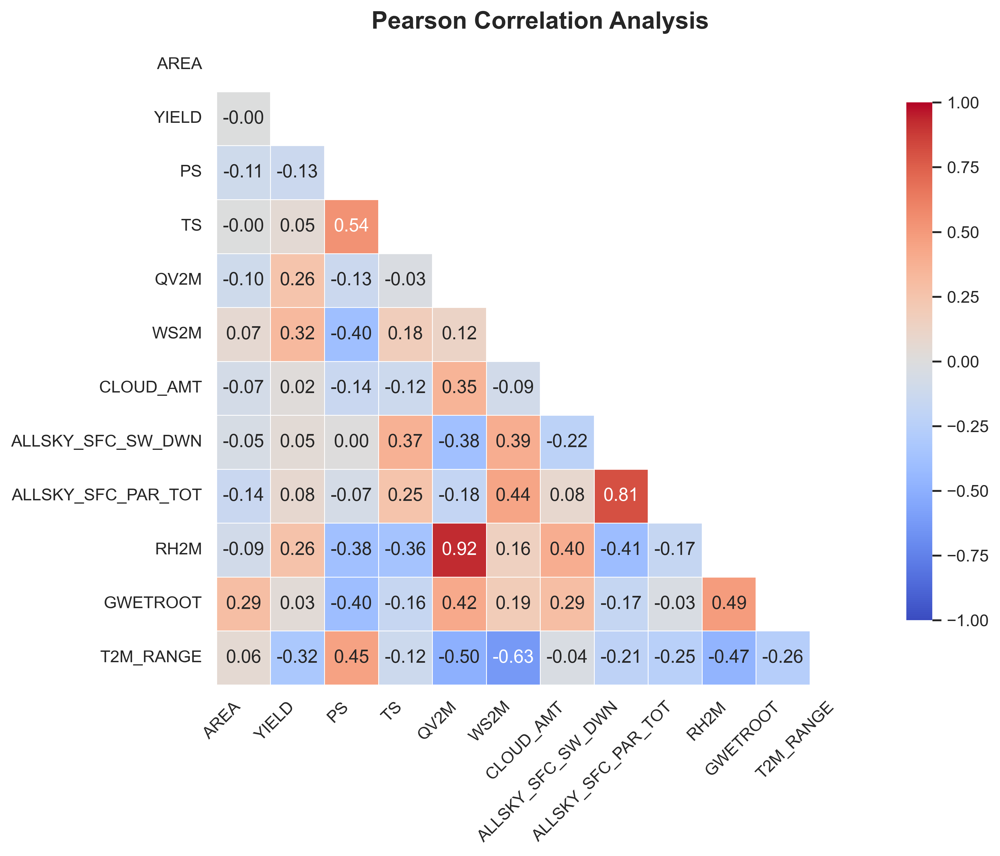

In [12]:
# Compute the Pearson correlation matrix
corr = data.select_dtypes(include = ['number']).corr(method='pearson')

# Create a mask for the **upper triangle**
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
plt.figure(figsize=(10, 8), dpi = 400)
sns.set(style="white")

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(
    corr,
    mask=mask,
    cmap='coolwarm',
    annot=True,
    fmt='.2f',
    linewidths=0.5,
    square=True,
    cbar_kws={"shrink": 0.8},
    vmax=1,
    vmin=-1
)

plt.title('Pearson Correlation Analysis', fontsize=16, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## Outlier Analysis

## Visualizing Outliers using Boxplots

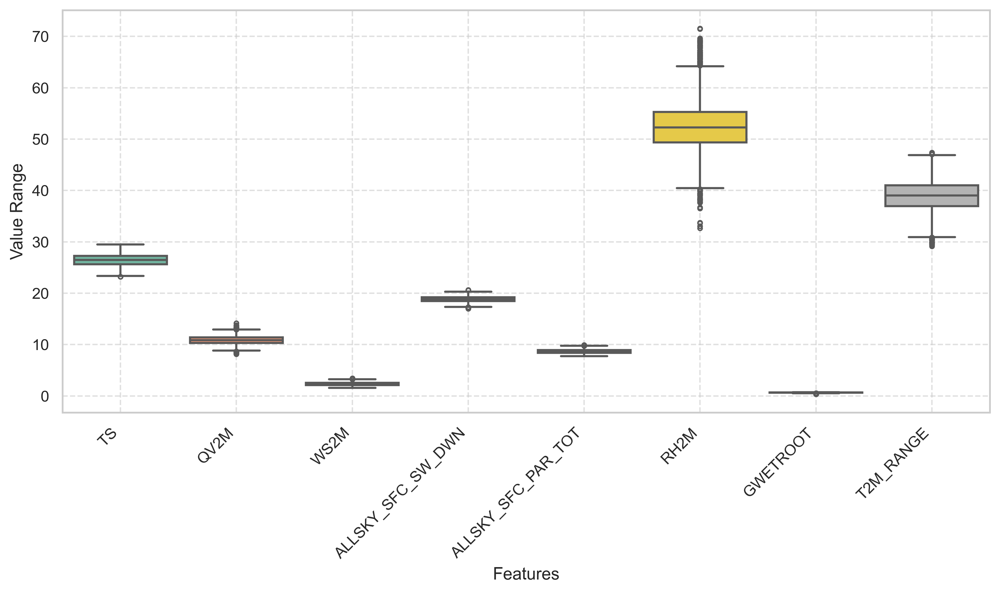

In [13]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6), dpi = 400)
sns.boxplot(data=data.drop(columns=['AREA', 'YIELD', 'PS', 'CLOUD_AMT']), 
            palette="Set2", 
            linewidth=1.5, 
            fliersize=3)

#plt.title("Distribution of Features", fontsize=16, fontweight='bold')
plt.xlabel("Features", fontsize=12)
plt.ylabel("Value Range", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

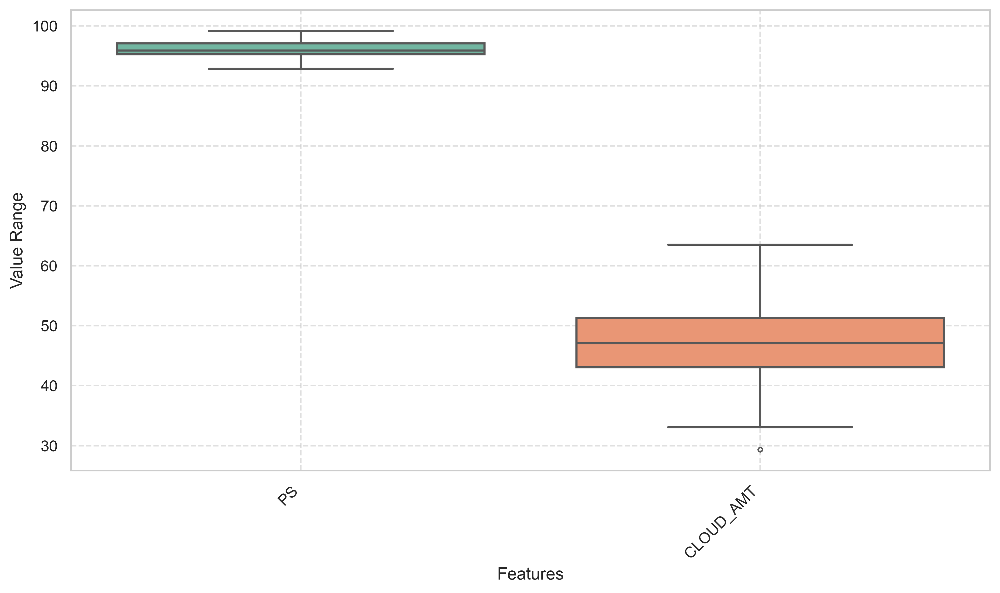

In [14]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6), dpi = 400)
sns.boxplot(data=data[['PS', 'CLOUD_AMT']], 
            palette="Set2", 
            linewidth=1.5, 
            fliersize=3)

#plt.title("Distribution of Features", fontsize=16, fontweight='bold')
plt.xlabel("Features", fontsize=12)
plt.ylabel("Value Range", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

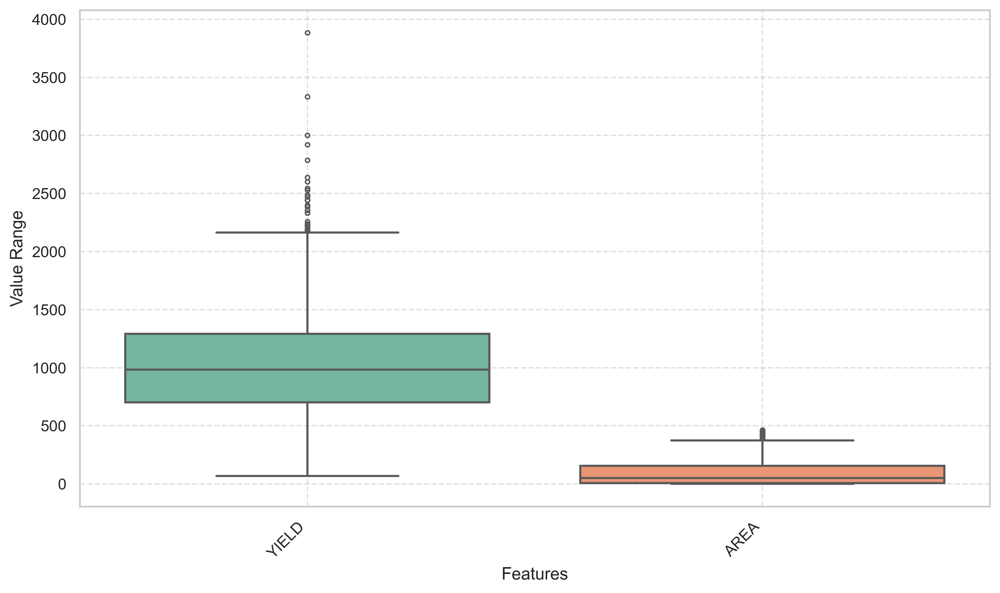

In [15]:
sns.set(style="whitegrid")
plt.figure(figsize=(10, 6), dpi = 400)
sns.boxplot(data=data[['YIELD', 'AREA']], 
            palette="Set2", 
            linewidth=1.5, 
            fliersize=3)

#plt.title("Distribution of Features", fontsize=16, fontweight='bold')
plt.xlabel("Features", fontsize=12)
plt.ylabel("Value Range", fontsize=12)
plt.xticks(rotation=45, ha='right')
plt.grid(True, linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [16]:
df_cleaned = data.copy()

### Removing outliers using IQR Method

In [17]:
def remove_outliers_iqr(data, columns):
    clean_data = df_cleaned.copy()
    for col in columns:
        Q1 = clean_data[col].quantile(0.25)
        Q3 = clean_data[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 2 * IQR
        upper_bound = Q3 + 2 * IQR
        clean_data = clean_data[(clean_data[col] >= lower_bound) & (clean_data[col] <= upper_bound)]
    return clean_data

In [18]:
numerical_columns = data.select_dtypes(include = ['number']).columns.tolist()
iqr_cleaned = remove_outliers_iqr(df_cleaned, numerical_columns)
iqr_cleaned = iqr_cleaned[iqr_cleaned['YIELD'] < 2400]
iqr_cleaned = iqr_cleaned.reset_index(drop=True)
iqr_cleaned.shape

(1638, 17)

## Data Visualization

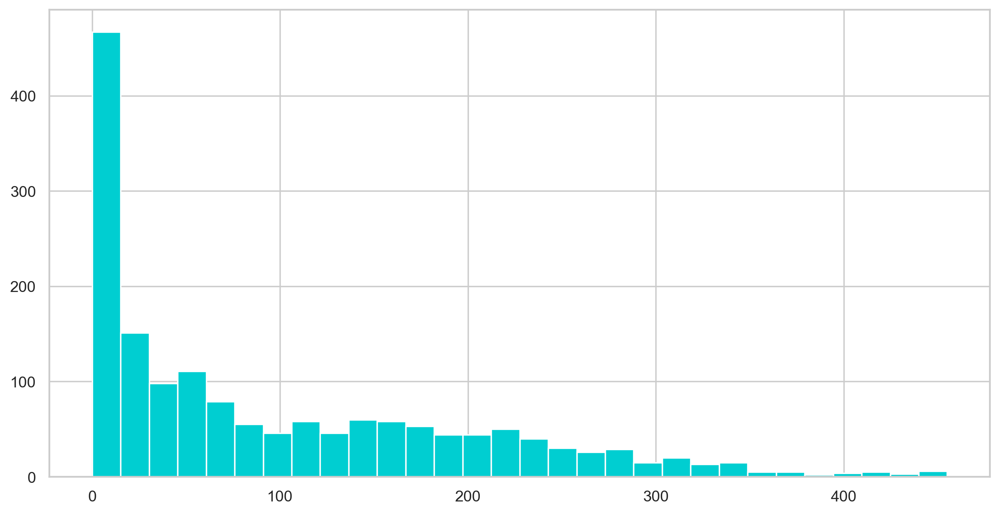

In [19]:
plt.figure(figsize = (12, 6), dpi = 250)
plt.hist(iqr_cleaned['AREA'], bins = 30, color = 'darkturquoise')
plt.grid(True)
plt.show()

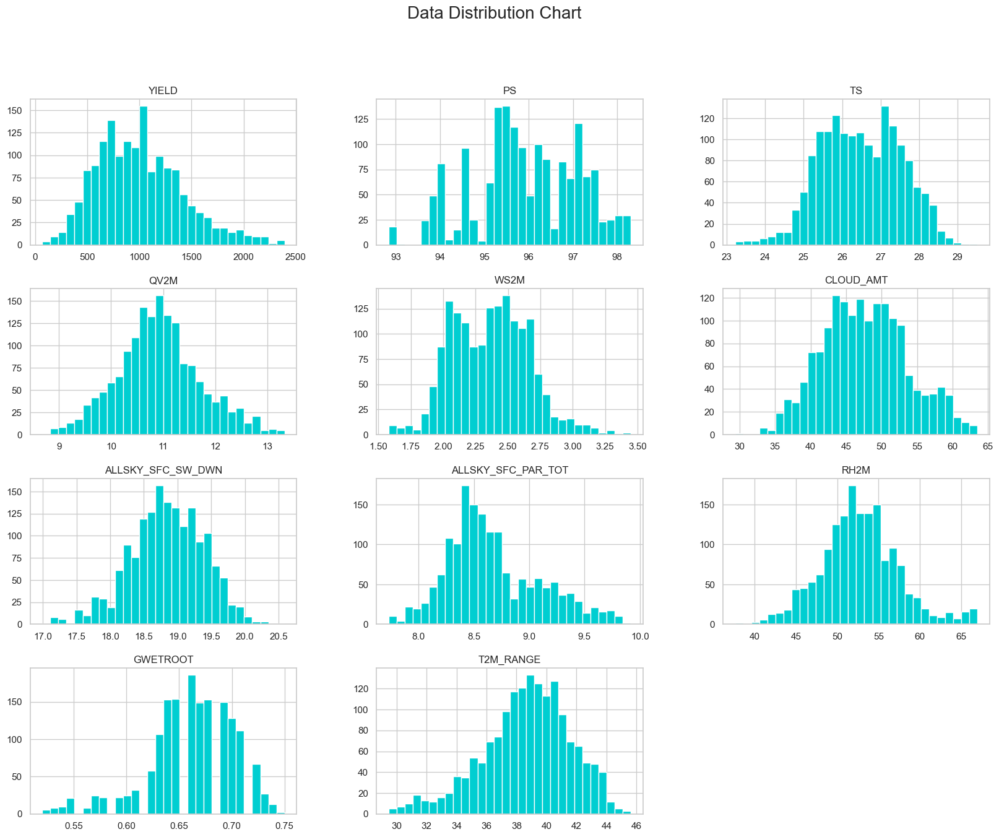

In [20]:
iqr_cleaned.drop(columns = 'AREA').hist(bins = 30, figsize = (20,15), color = 'darkturquoise')
plt.suptitle("Data Distribution Chart", fontsize = 20)
plt.show()

In [30]:
def plot_predicted_vs_actual(y_true, y_pred, title="Predicted vs Actual Crop Yield", cmap=plt.cm.viridis):
    """
    Plots a scatter plot of predicted vs actual values with a color gradient.
    
    Parameters:
    - y_true: array-like, true target values
    - y_pred: array-like, predicted target values
    - title: str, title of the plot
    - cmap: matplotlib colormap, default viridis
    """
    r2 = r2_score(y_true, y_pred)
    norm = plt.Normalize(vmin=np.min(y_true), vmax=np.max(y_true))
    fig, ax = plt.subplots(figsize=(8, 5), dpi = 450)
    
    scatter = ax.scatter(
        y_true, y_pred,
        c=y_true, cmap=cmap, norm=norm,
        edgecolor='black', s=70, alpha=0.9
    )
    ax.plot(
        [np.min(y_true), np.max(y_true)],
        [np.min(y_true), np.max(y_true)],
        color='red', linestyle='-', linewidth=2, label='Ideal Fit'
    )
    ax.set_xlabel("Actual Yield", fontsize=12)
    ax.set_ylabel("Predicted Yield", fontsize=12)
    ax.set_title(f"{title} (R² = {r2:.2f})", fontsize=14, )
    cbar = fig.colorbar(scatter, ax=ax)
    cbar.set_label('Actual Yield', fontsize=11)
    ax.grid(linestyle=':', linewidth=0.5)
    ax.legend()
    plt.tight_layout()
    plt.savefig(rf"plots\{title}.svg", dpi = 400)
    plt.show()

# Generating Synthetic Data using SMOGN
### Synthetic Minority Over-Sampling Technique for Regression with Gaussian Noise

In [25]:
import warnings
warnings.filterwarnings("ignore")
df_balanced = smogn.smoter(
    data=iqr_cleaned,
    y='YIELD',     # target column name
    samp_method='extreme'  # focuses on tail ends
)

print("Original:", len(iqr_cleaned))
print("After SMOGN:", len(df_balanced))

r_index: 100%|############################################################################| 35/35 [00:00<00:00, 252.68it/s]

Original: 1638
After SMOGN: 2773


In [116]:
#df_balanced.to_csv("smogn_data.csv", index = False)

In [115]:
#df_balanced = pd.read_csv("smogn_data.csv")

# Setting up the Data Preprocessing Pipeline

In [23]:
numerical_columns = df_balanced.select_dtypes(include = ['number']).columns.tolist()
numerical_columns.remove('YIELD')
categorical_columns = df_balanced.select_dtypes(include = ['object']).columns.tolist()
target_column = "YIELD"

In [24]:
df_balanced = df_balanced[df_balanced['YIELD'] < 2400]
df_final = df_balanced.copy()

In [25]:
# Specifying Ordinal Encoding Order for Soil Depth & Nutrients
soil_depth_order = [['25-50', '50-100', '100-300', '300']]
nutrient_order = [["Low", "Medium", "High"]]

In [26]:
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

preprocessor = ColumnTransformer([
    ("num", StandardScaler(), numerical_columns),
    ("soil", OneHotEncoder(), ["Soil Type"]),
    ("depth", OrdinalEncoder(categories = soil_depth_order), ["Soil Depth"]),
    ("nutrients", OrdinalEncoder(categories = nutrient_order * 3), ["Nitrogen(N)", "Phosphorous(P)", "Potassium(K)"])
])

## Splitting the dataset

In [27]:
# Splitting the dataset
X = df_final.drop(columns = [target_column])
y = df_final[target_column]

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.15)

X_train.shape, X_test.shape

((2346, 16), (415, 16))

# Machine Learning Models

## XGBoost

In [28]:
from xgboost import XGBRegressor

xgbr = XGBRegressor(n_estimators=1000,  # Increase trees for better learning
                    learning_rate=0.01,  # Reduce learning rate for better generalization
                    max_depth=14,  # Increase depth if underfitting
                    subsample=0.9,  # Reduce overfitting
                    colsample_bytree=0.45,  # Reduce overfitting
                    reg_lambda=0.5,  # L2 regularization
                    reg_alpha=0.5) # L1 regularization (increase for sparse features)

pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", xgbr)
])
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")
print(f"MSE: {mse}")

MAE: 168.9454773404373
RMSE: 237.10007532504673
R²: 0.7638550974592763
MSE: 56216.44571914283


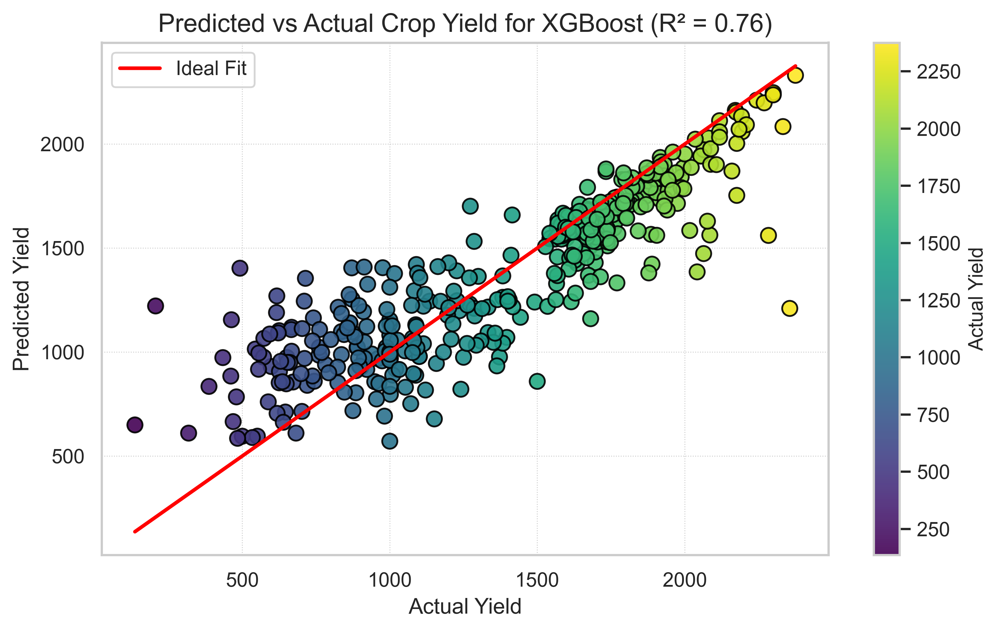

In [31]:
plot_predicted_vs_actual(y_test, y_pred, title="Predicted vs Actual Crop Yield for XGBoost")

In [32]:
kfold = KFold(n_splits = 10, shuffle=True)

# Use cross_val_score for R^2 scoring (default for regression)
scores = cross_val_score(pipeline, X, y, cv=kfold, scoring='r2')

# Print scores
print("Cross-Validation R^2 Scores:", scores)
print("Average R^2 Score:", np.mean(scores))


Cross-Validation R^2 Scores: [0.81971984 0.79917345 0.79097299 0.7514845  0.70965907 0.80851781
 0.80430443 0.84452187 0.74187419 0.7881107 ]
Average R^2 Score: 0.7858338848550975


## Extra Trees Regressor

In [113]:
from sklearn.ensemble import ExtraTreesRegressor
extr = ExtraTreesRegressor(n_estimators = 1000)

pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", extr)
])
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")
print(f"MSE: {mse}")

MAE: 151.7542266813732
RMSE: 235.2196919383886
R²: 0.7675858609549585
MSE: 55328.30347559044


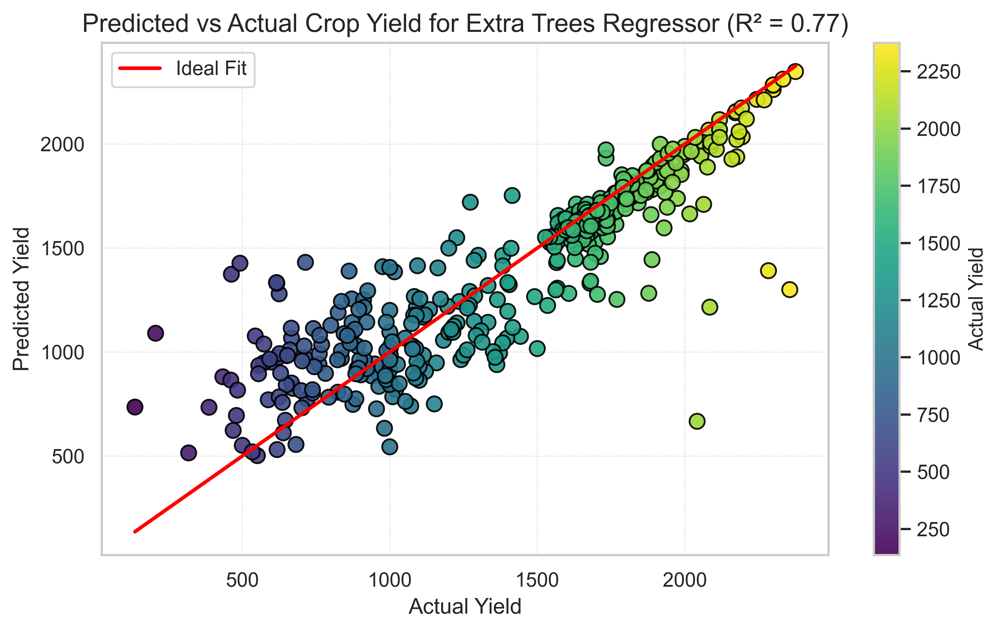

In [114]:
plot_predicted_vs_actual(y_test, y_pred, title="Predicted vs Actual Crop Yield for Extra Trees Regressor")

In [35]:
kfold = KFold(n_splits = 10, shuffle=True)

# Use cross_val_score for R^2 scoring (default for regression)
scores = cross_val_score(pipeline, X, y, cv=kfold, scoring='r2')

# Print scores
print("Cross-Validation R^2 Scores:", scores)
print("Average R^2 Score:", np.mean(scores))

Cross-Validation R^2 Scores: [0.82966157 0.79875055 0.83380986 0.79146148 0.7954457  0.70907921
 0.76673434 0.80551448 0.81526363 0.80673522]
Average R^2 Score: 0.7952456037332675


## Decision Tree Regressor

In [36]:
from sklearn.tree import DecisionTreeRegressor
dtr = DecisionTreeRegressor(max_depth = 18)

pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model",dtr)
])

pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")
print(f"MSE: {mse}")

MAE: 226.60443503578387
RMSE: 367.80788503743275
R²: 0.4317266860362232
MSE: 135282.64029570934


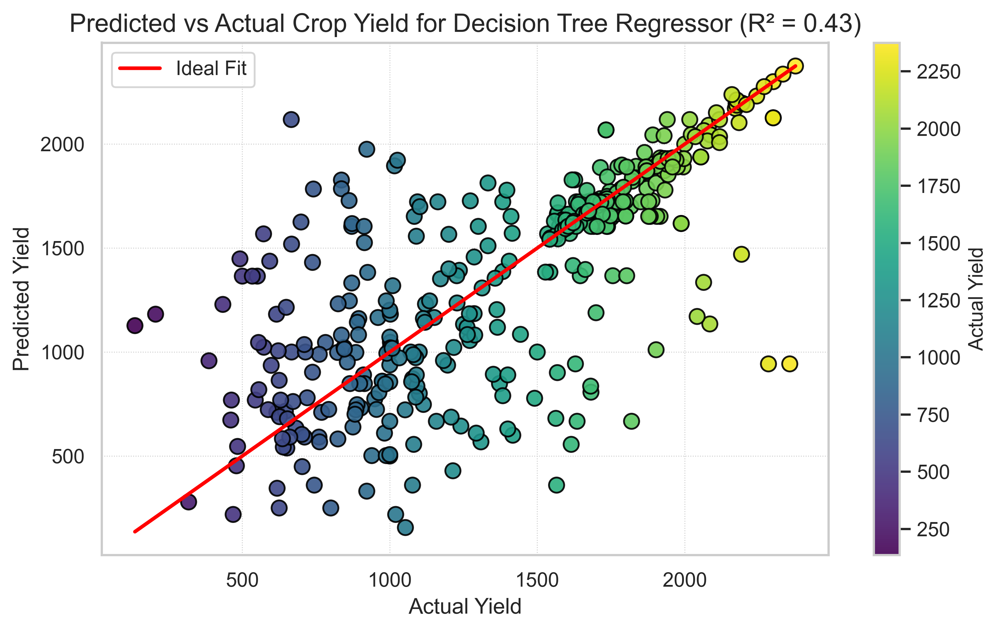

In [37]:
plot_predicted_vs_actual(y_test, y_pred, title="Predicted vs Actual Crop Yield for Decision Tree Regressor")

In [38]:
kfold = KFold(n_splits = 10, shuffle=True)

# Use cross_val_score for R^2 scoring (default for regression)
scores = cross_val_score(pipeline, X, y, cv=kfold, scoring='r2')

# Print scores
print("Cross-Validation R^2 Scores:", scores)
print("Average R^2 Score:", np.mean(scores))

Cross-Validation R^2 Scores: [0.55969939 0.53391732 0.53093506 0.54803354 0.49223876 0.55499715
 0.52329955 0.50588253 0.6081748  0.38922802]
Average R^2 Score: 0.5246406134236571


## Random Forest Regressor

In [40]:
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor()

pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", rfr)
])
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")
print(f"MSE: {mse}")

MAE: 176.11990982337903
RMSE: 252.75915087367554
R²: 0.7316330893280862
MSE: 63887.188350381475


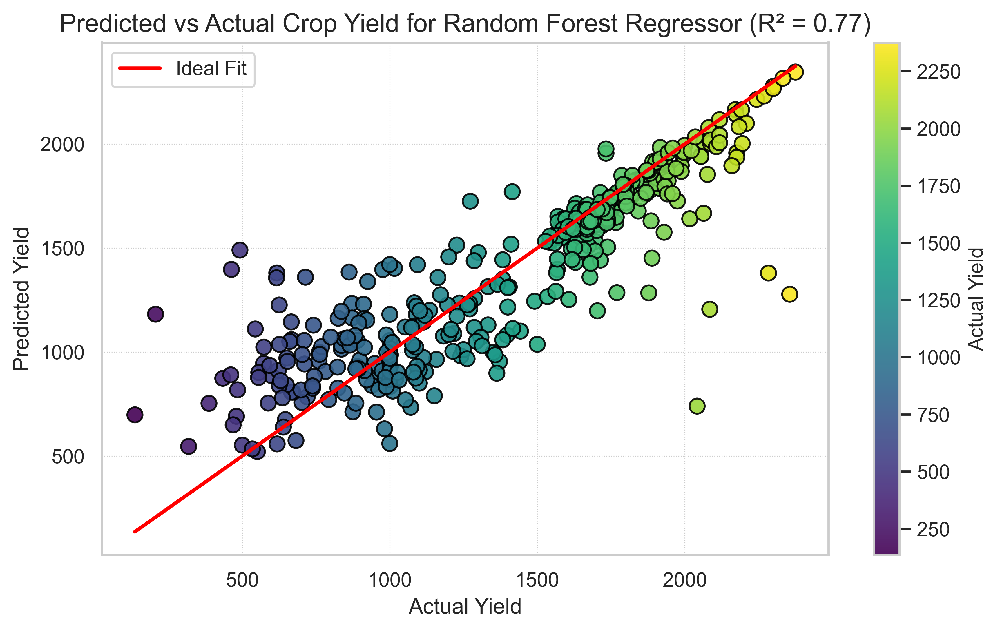

In [42]:
plot_predicted_vs_actual(y_test, y_pred, title="Predicted vs Actual Crop Yield for Random Forest Regressor")

In [44]:
kfold = KFold(n_splits = 10, shuffle=True)

# Use cross_val_score for R^2 scoring (default for regression)
scores = cross_val_score(pipeline, X, y, cv=kfold, scoring='r2')

# Print scores
print("Cross-Validation R^2 Scores:", scores)
print("Average R^2 Score:", np.mean(scores))

Cross-Validation R^2 Scores: [0.80888717 0.7542217  0.77857829 0.82447343 0.82179295 0.79848029
 0.77393065 0.80113802 0.81050846 0.80050673]
Average R^2 Score: 0.7972517688482729


## Support Vector Regressor

In [46]:
from sklearn.svm import SVR
svr  = SVR(kernel='linear')

pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", svr)
])
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")
print(f"MSE: {mse}")

MAE: 311.0610592581954
RMSE: 398.5778900611116
R²: 0.332668540407725
MSE: 158864.33444556754


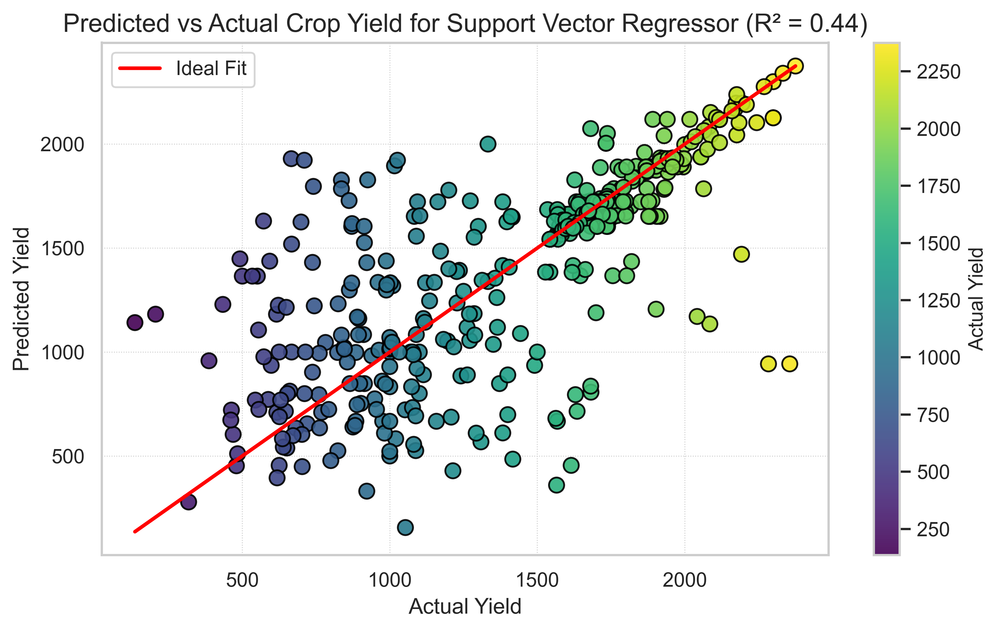

In [48]:
plot_predicted_vs_actual(y_test, y_pred, title="Predicted vs Actual Crop Yield for Support Vector Regressor")

In [50]:
kfold = KFold(n_splits = 10, shuffle=True)

# Use cross_val_score for R^2 scoring (default for regression)
scores = cross_val_score(pipeline, X, y, cv=kfold, scoring='r2')

# Print scores
print("Cross-Validation R^2 Scores:", scores)
print("Average R^2 Score:", np.mean(scores))

Cross-Validation R^2 Scores: [0.53460082 0.60249096 0.51991253 0.52527875 0.54093104 0.50684742
 0.59257763 0.4883295  0.52442245 0.48458501]
Average R^2 Score: 0.5319976110216487


## Ridge Regressor

In [104]:
from sklearn.linear_model import Ridge
rr = Ridge(alpha=0.7)  # alpha is the regularization strength

pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", rr)
])
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")
print(f"MSE: {mse}")

MAE: 315.0544104507704
RMSE: 392.9244068093235
R²: 0.3514653213757969
MSE: 154389.58946645877


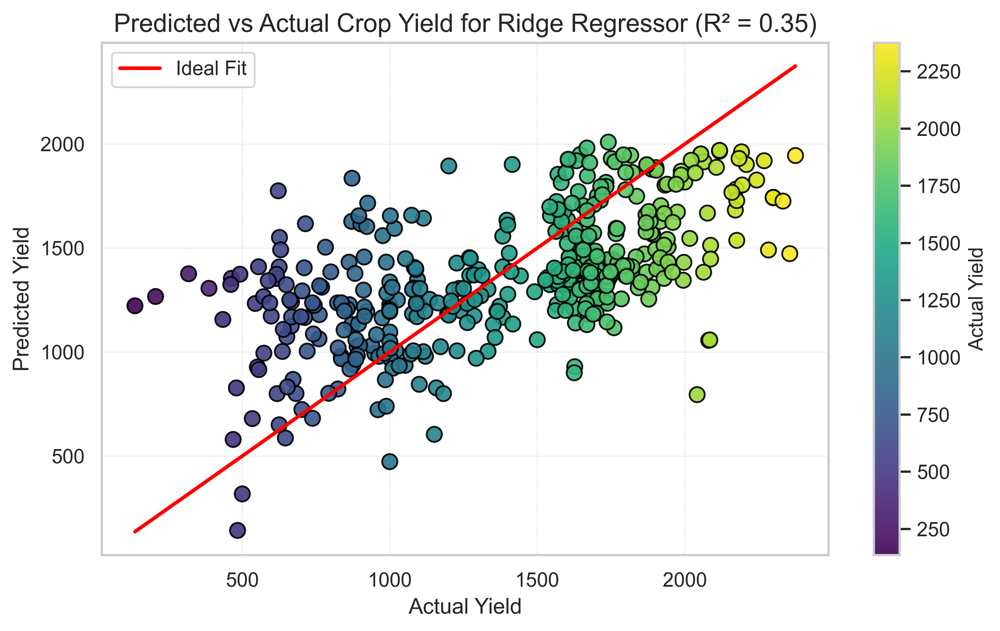

In [105]:
plot_predicted_vs_actual(y_test, y_pred, title="Predicted vs Actual Crop Yield for Ridge Regressor")

In [56]:
kfold = KFold(n_splits = 10, shuffle=True)

# Use cross_val_score for R^2 scoring (default for regression)
scores = cross_val_score(pipeline, X, y, cv=kfold, scoring='r2')

# Print scores
print("Cross-Validation R^2 Scores:", scores)
print("Average R^2 Score:", np.mean(scores))

Cross-Validation R^2 Scores: [0.74255627 0.72149407 0.80332186 0.75572128 0.7472619  0.74421613
 0.76956739 0.72661655 0.81190315 0.78086806]
Average R^2 Score: 0.7603526665693312


## Lasso Regressor

In [58]:
from sklearn.linear_model import Lasso
lr = Lasso(alpha=0.7)  # alpha is the regularization strength

pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", lr)
])

pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")
print(f"MSE: {mse}")

MAE: 314.6407587955502
RMSE: 393.0583586734248
R²: 0.35102306207364786
MSE: 154494.87332304663


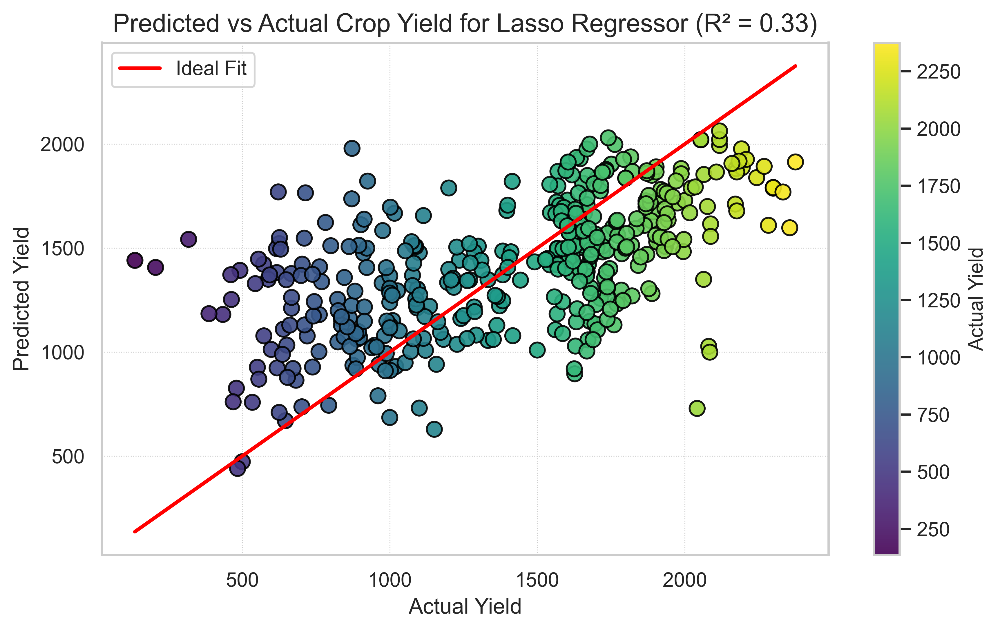

In [60]:
plot_predicted_vs_actual(y_test, y_pred, title="Predicted vs Actual Crop Yield for Lasso Regressor")

In [62]:
kfold = KFold(n_splits = 10, shuffle=True)

# Use cross_val_score for R^2 scoring (default for regression)
scores = cross_val_score(pipeline, X, y, cv=kfold, scoring='r2')

# Print scores
print("Cross-Validation R^2 Scores:", scores)
print("Average R^2 Score:", np.mean(scores))

Cross-Validation R^2 Scores: [0.314987   0.2991406  0.28059781 0.44366341 0.30176562 0.41714249
 0.32565194 0.31433804 0.37277915 0.33922767]
Average R^2 Score: 0.34092937245323857


In [64]:
from sklearn.linear_model import LassoCV

lr = LassoCV(alphas=np.logspace(-4, 1, 50), cv=5)

pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", lr)
])

pipeline.fit(X_train, y_train)
print("Best alpha:", pipeline.named_steps["model"].alpha_)
print("Test score:", pipeline.score(X_test, y_test))


Best alpha: 0.11513953993264481
Test score: 0.3514636056946432


## K Neighbors Regressor

In [66]:
from sklearn.neighbors import KNeighborsRegressor

knnr = KNeighborsRegressor(n_neighbors = 7)

pipeline = Pipeline([
    ("preprocessor", preprocessor),
    ("model", knnr)
])
pipeline.fit(X_train, y_train)
y_pred = pipeline.predict(X_test)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")
print(f"MSE: {mse}")

MAE: 189.27102240398338
RMSE: 298.84605203753136
R²: 0.6248454335563387
MSE: 89308.96281841889


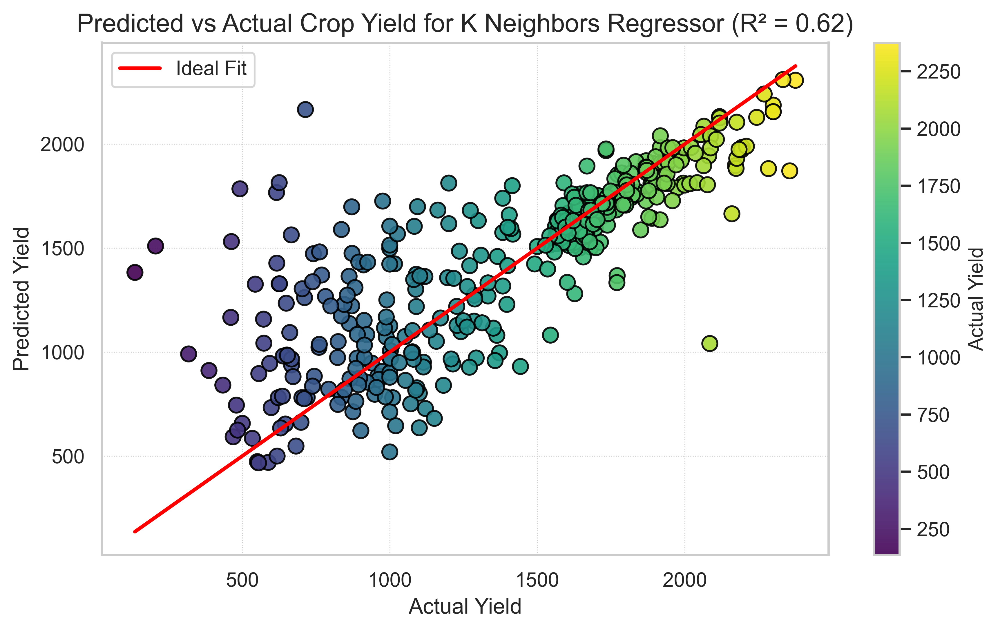

In [68]:
plot_predicted_vs_actual(y_test, y_pred, title="Predicted vs Actual Crop Yield for K Neighbors Regressor")

In [70]:
kfold = KFold(n_splits = 10, shuffle=True)

# Use cross_val_score for R^2 scoring (default for regression)
scores = cross_val_score(pipeline, X, y, cv=kfold, scoring='r2')

# Print scores
print("Cross-Validation R^2 Scores:", scores)
print("Average R^2 Score:", np.mean(scores))

Cross-Validation R^2 Scores: [0.64635731 0.69770341 0.74889866 0.58423297 0.62263865 0.69690626
 0.65552309 0.65786341 0.65950159 0.67464579]
Average R^2 Score: 0.6644271128750517


# Explainability in Prediction

## SHAP

In [72]:
X_train_transformed = preprocessor.fit_transform(X_train)
X_test_transformed = preprocessor.transform(X_test)

In [74]:
from sklearn.ensemble import ExtraTreesRegressor
extr = ExtraTreesRegressor()
extr.fit(X_train_transformed, y_train)

ExtraTreesRegressor()

In [76]:
y_pred = extr.predict(X_test_transformed)
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae}")
print(f"RMSE: {rmse}")
print(f"R²: {r2}")
print(f"MSE: {mse}")

MAE: 152.15760994498964
RMSE: 234.07754085342918
R²: 0.7698374376322389
MSE: 54792.29513198881


In [78]:
feature_names=preprocessor.get_feature_names_out()
feature_names

array(['num__AREA', 'num__PS', 'num__TS', 'num__QV2M', 'num__WS2M',
       'num__CLOUD_AMT', 'num__ALLSKY_SFC_SW_DWN',
       'num__ALLSKY_SFC_PAR_TOT', 'num__RH2M', 'num__GWETROOT',
       'num__T2M_RANGE', 'soil__Soil Type_Black',
       'soil__Soil Type_Mixed Red & Black', 'soil__Soil Type_Red',
       'depth__Soil Depth', 'nutrients__Nitrogen(N)',
       'nutrients__Phosphorous(P)', 'nutrients__Potassium(K)'],
      dtype=object)

In [80]:
import shap
explainer = shap.Explainer(extr, X_test_transformed, feature_names=preprocessor.get_feature_names_out())
shap_values = explainer(X_test_transformed)

 98%|===================| 405/415 [00:37<00:00]        

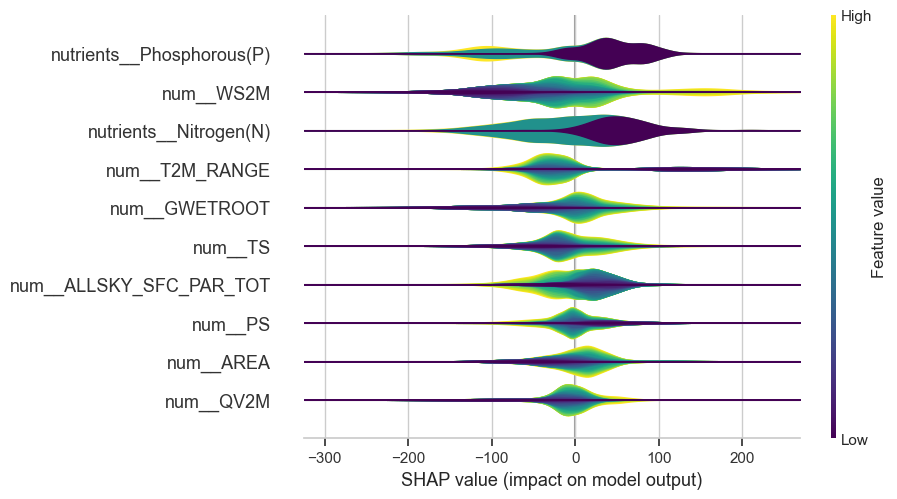

In [82]:
shap.plots.violin(shap_values, 
                  features=X_test_transformed, 
                  feature_names=preprocessor.get_feature_names_out(), 
                  plot_type="layered_violin", 
                  color='viridis',  
                  max_display=10)

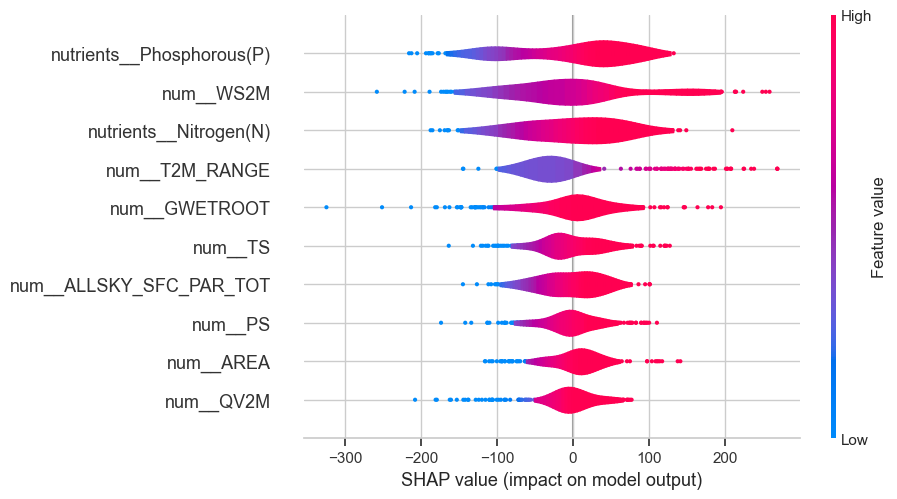

In [84]:
import pandas as pd
import numpy as np
import shap
import matplotlib.pyplot as plt

# Extract SHAP values and feature names
shap_array = shap_values.values
feature_names = shap_values.feature_names

# Convert SHAP values to DataFrame
shap_df = pd.DataFrame(shap_array, columns=feature_names)

# Identify soil type OHE columns (but not soil depth)
soil_type_cols = [col for col in shap_df.columns if 'soil__Soil Type_' in col]

# Sum SHAP values for Soil Type
shap_df['Soil Type'] = shap_df[soil_type_cols].sum(axis=1)

# Drop original soil type OHE columns
shap_df_grouped = shap_df.drop(columns=soil_type_cols)

# Updated feature names
feature_names_grouped = shap_df_grouped.columns.tolist()

# Create grouped SHAP Explanation object
grouped_shap_values = shap.Explanation(
    values=shap_df_grouped.values,
    base_values=np.zeros(shap_df_grouped.shape[0]),
    data=shap_df_grouped.values,
    feature_names=feature_names_grouped
)

# Plot grouped SHAP violin plot
shap.plots.violin(grouped_shap_values,  max_display=10)
plt.show()


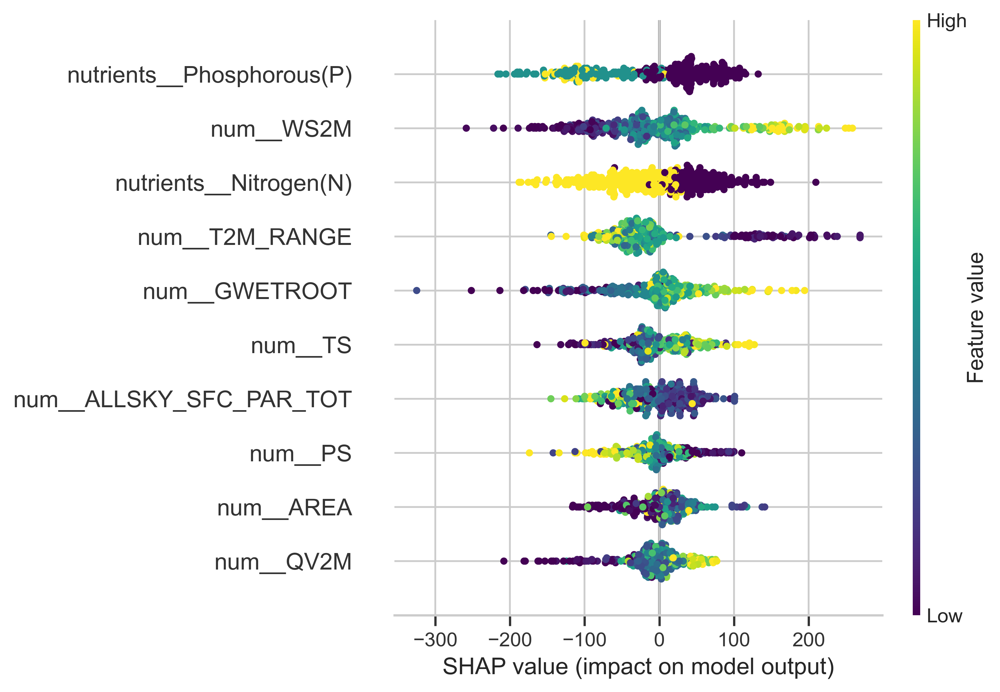

In [86]:
plt.figure(figsize = (10, 6), dpi = 400)
shap.summary_plot(shap_values, 
                  X_test_transformed,
                  cmap = "viridis", max_display=10, show = False)
plt.gcf().savefig(rf"plots\shap_summary_plot.svg", dpi=400, bbox_inches='tight')
plt.show()

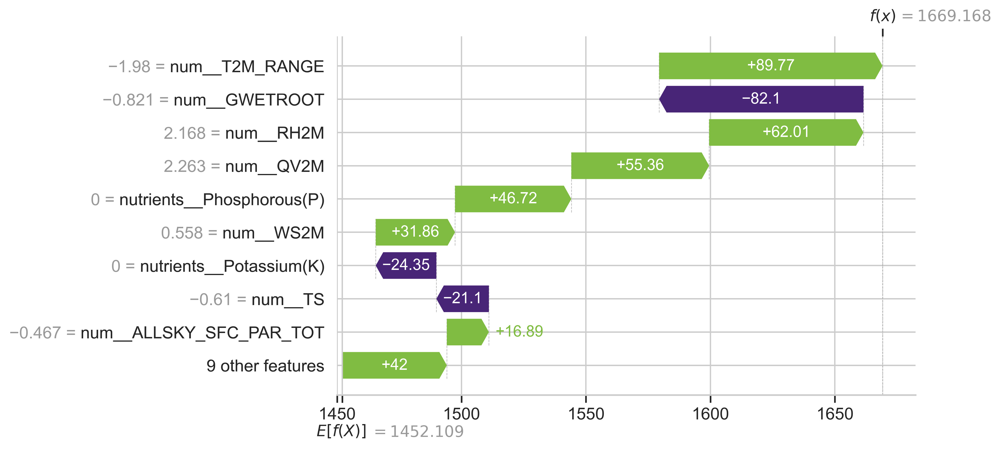

In [103]:
import matplotlib
import matplotlib.pyplot as plt

default_pos_color = "#ff0051"
default_neg_color = "#008bfb"

positive_color = "#7fbc41"
negative_color = "#482577"

# Plot waterfall without showing
shap.plots.waterfall(shap_values[23], show=False)

fig = plt.gcf()
fig.set_size_inches(8, 5)      # Set desired figure size
fig.set_dpi(400)               # DPI affects display but less SVG save

# Get current axes and add a light dotted grid
ax = plt.gca()
ax.grid(True, linestyle='--', linewidth=0.4, color='gray', alpha=0.3)  # light dotted grid

for fc in fig.get_children():
    for fcc in fc.get_children():
        if isinstance(fcc, matplotlib.patches.FancyArrow):
            fcc.set_edgecolor('none')
            if matplotlib.colors.to_hex(fcc.get_facecolor()) == default_pos_color:
                fcc.set_facecolor(positive_color)
            elif matplotlib.colors.to_hex(fcc.get_facecolor()) == default_neg_color:
                fcc.set_facecolor(negative_color)
        elif isinstance(fcc, plt.Text):
            if matplotlib.colors.to_hex(fcc.get_color()) == default_pos_color:
                fcc.set_color(positive_color)
            elif matplotlib.colors.to_hex(fcc.get_color()) == default_neg_color:
                fcc.set_color(negative_color)

fig.savefig(rf'plots/waterfall_plot.svg', bbox_inches='tight')  # Use bbox_inches='tight' to avoid cropping
plt.show()


## LIME

In [96]:
import lime
import lime.lime_tabular
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train_transformed),
    mode='regression',
    feature_names=preprocessor.get_feature_names_out(),   # List of feature names
    discretize_continuous=True,
    verbose = True
)

In [97]:
i = 45# Index of the sample in X_test
sample = X_test_transformed[i]
print("True value:", y_test.iloc[i])
print("Predicted value:", extr.predict([sample])[0])


True value: 1158.0
Predicted value: 953.4134559643255


Intercept 1155.1466428790316
Prediction_local [924.95370051]
Right: 953.4134559643255


C:\Users\DELL\AppData\Local\Temp\ipykernel_28964\868554017.py:17: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis')


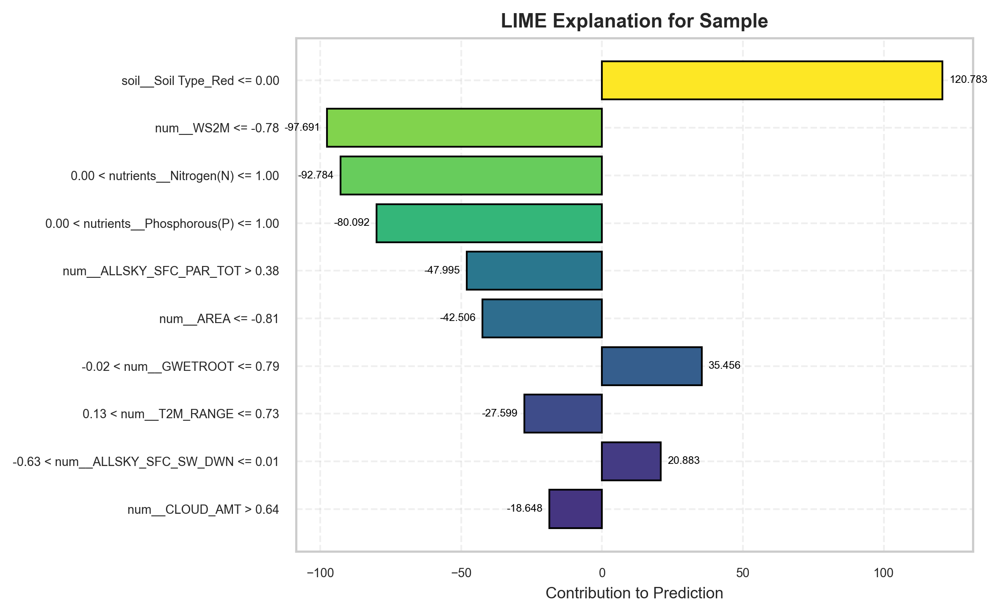

In [99]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import cm
from matplotlib.colors import Normalize

# Get explanation
exp = explainer.explain_instance(
    data_row=sample,
    predict_fn=extr.predict
)

# Extract feature names and contributions
features, contributions = zip(*exp.as_list())

# Normalize the absolute contributions for coloring
norm = Normalize(vmin=0, vmax=max(abs(c) for c in contributions))
cmap = cm.get_cmap('viridis')
colors = [cmap(norm(abs(c))) for c in contributions]

# Create figure and axis with high DPI and good size
fig, ax = plt.subplots(figsize=(8, 5), dpi=300)

# Plot horizontal bar chart
bars = ax.barh(features, contributions, color=colors, edgecolor='black')

# Invert y-axis for top features on top
ax.invert_yaxis()

# Add grid with subtle style
ax.grid(True, linestyle='--', alpha=0.3)

# Labels and title with smaller font sizes
ax.set_xlabel('Contribution to Prediction', fontsize=9)
ax.set_title('LIME Explanation for Sample', fontsize=11, fontweight='bold')

# Make x and y tick labels smaller
ax.tick_params(axis='x', labelsize=7)
ax.tick_params(axis='y', labelsize=7)

# Add value labels at the end of each bar with smaller font
for bar in bars:
    width = bar.get_width()
    ax.text(
        width + np.sign(width)*0.02*max(contributions),
        bar.get_y() + bar.get_height()/2,
        f'{width:.3f}',
        va='center', ha='left' if width >= 0 else 'right',
        fontsize=6,
        color='black'
    )

plt.tight_layout()
fig.savefig(rf'plots/lime_plot.svg', bbox_inches='tight')  # Use bbox_inches='tight' to avoid cropping
plt.show()
